## Импорт библиотек

In [61]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

## Cодержание
Этот набор данных содержит список видеоигр с объемом продаж более 100 000 копий. Это было произведено vgchartz.com .

Поля включают

Ранг - Рейтинг общих продаж

Название - Название игры

Платформа - платформа выпуска игр (т.е. ПК, PS4 и т. Д.)

Год - год выпуска игры

Жанр - Жанр игры

Издатель - издатель игры

NA_Sales - Продажи в Северной Америке (в миллионах)

EU_Sales - Продажи в Европе (в миллионах)

JP_Sales - Продажи в Японии (в миллионах)

Other_Sales - Продажи в остальном мире (в миллионах)

Global_Sales - общий объем продаж по всему миру.

Есть 16 598 записей.

In [62]:
#Загрузка данных. Первые 5 строк датасета.
data = pd.read_csv('vgsales.csv')
data.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [63]:
print(data.shape)

(16598, 11)


In [64]:
print(data.columns)

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'],
      dtype='object')


In [65]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB
None


In [66]:
# Проверим наличие пустых значений
# Цикл по колонкам датасета
for col in data.columns:
    # Количество пустых значений - все значения заполнены
    temp_null_count = data[data[col].isnull()].shape[0]
    print('{} - {}'.format(col, temp_null_count))

Rank - 0
Name - 0
Platform - 0
Year - 271
Genre - 0
Publisher - 58
NA_Sales - 0
EU_Sales - 0
JP_Sales - 0
Other_Sales - 0
Global_Sales - 0


In [67]:
#Заполним средним значением год выпуска игры
data['Year'] = data['Year'].replace(0,np.nan)
data['Year'] = data['Year'].fillna(data['Year'].mean())

In [68]:
#Проверяем заполненность данных 
data.head(pd.set_option('display.max_rows', None))

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.000000,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.000000,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.000000,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.000000,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.000000,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
5,6,Tetris,GB,1989.000000,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26
6,7,New Super Mario Bros.,DS,2006.000000,Platform,Nintendo,11.38,9.23,6.50,2.90,30.01
7,8,Wii Play,Wii,2006.000000,Misc,Nintendo,14.03,9.20,2.93,2.85,29.02
8,9,New Super Mario Bros. Wii,Wii,2009.000000,Platform,Nintendo,14.59,7.06,4.70,2.26,28.62
9,10,Duck Hunt,NES,1984.000000,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31


## Удаление столбца, в котором недостаточно данных

In [70]:
data.drop(['Publisher'], axis = 1, inplace = True)

In [71]:
data.head()

,Rank,Name,Platform,Year,Genre,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,31.37


## Визуальное исследование датасета

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000024E888C0888>,
      dtype=object)

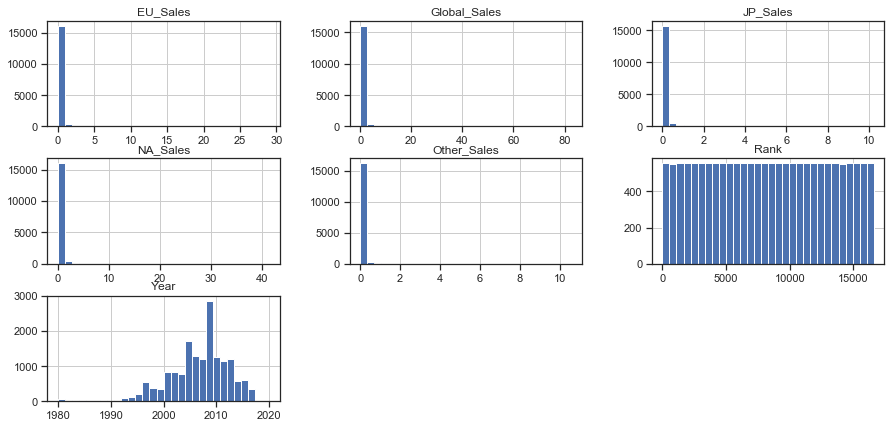

In [73]:
# Гистограммы для всех признаков
data.hist(bins=30, figsize = (15,7))

<Figure size 1008x504 with 0 Axes>

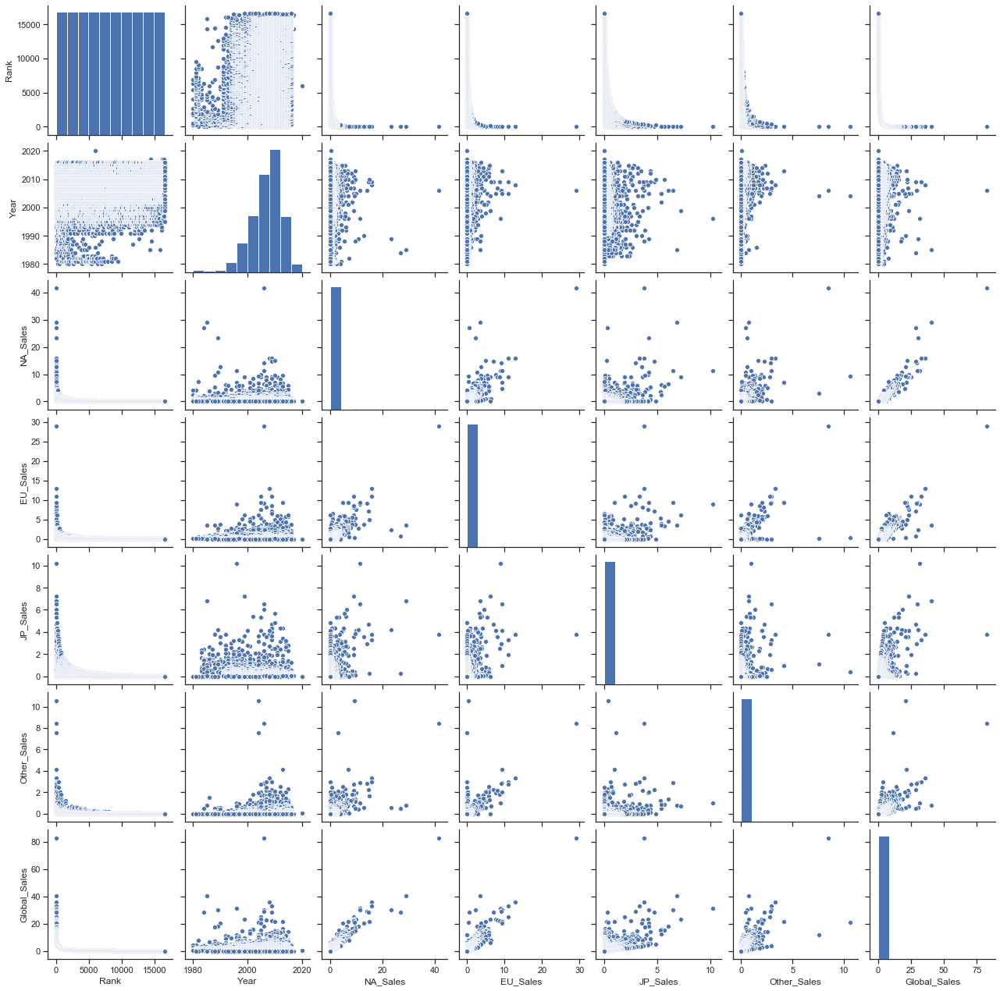

In [75]:
# Диаграммы рассеяние для всех признаков
plt.figure(figsize=(14,7))
sns.pairplot(data)

## Увеличенные диаграммы рассеяния для признаков, которые имеют зависимость с                                                       продажей игр в разных странах (в миллионах)

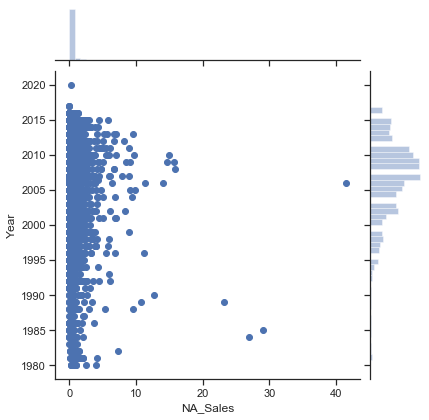

In [78]:
#Продажи в Северной Америке
sns.jointplot(x = "NA_Sales", y = "Year", kind="scatter", data = data)

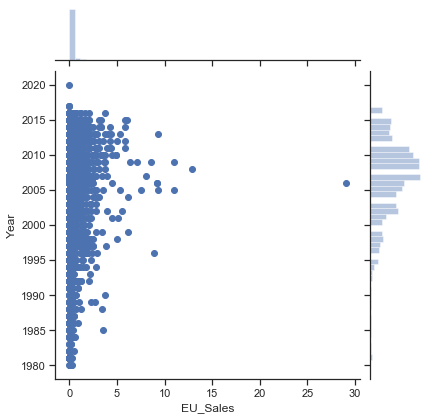

In [79]:
#Продажи в Европе
sns.jointplot(x = "EU_Sales", y = "Year", kind="scatter", data = data)

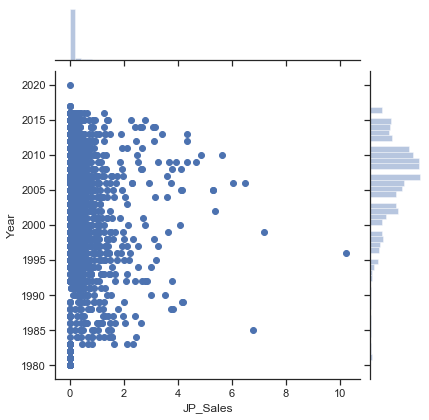

In [80]:
#Продажи в Японии
sns.jointplot(x = "JP_Sales", y = "Year", kind="scatter", data = data)

## Корреляции признаков

In [81]:
corr_matrix = data.corr()

In [82]:
corr_matrix['Rank']

Rank            1.000000
Year            0.177378
NA_Sales       -0.401362
EU_Sales       -0.379123
JP_Sales       -0.267785
Other_Sales    -0.332986
Global_Sales   -0.427407
Name: Rank, dtype: float64

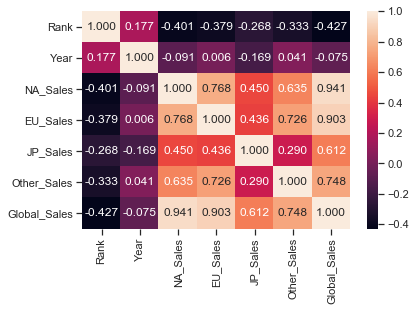

In [83]:
sns.heatmap(data.corr(), annot=True, fmt='.3f')

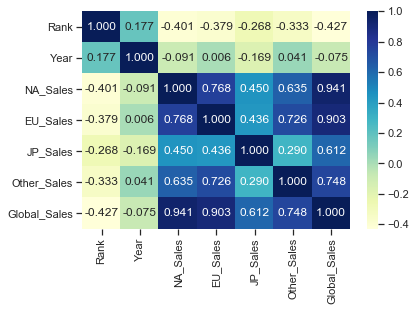

In [84]:
# Изменение цветовой гаммы
sns.heatmap(data.corr(), cmap='YlGnBu', annot=True, fmt='.3f')